<a href="https://colab.research.google.com/github/piacav/Traffic_signs/blob/main/Traffic_signs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Traffic Signs Project
---

In [ ]:
# clone Traffic_signs repo from git and give all permissions
import os

!git clone https://github.com/piacav/Traffic_signs.git
!mkdir /content/Traffic_signs/Models/backup
!mkdir /content/Traffic_signs/Dataset/Clips
if not os.path.isdir('/content/Traffic_signs/Output'):
  !mkdir /content/Traffic_signs/Output
!chmod +x ./Traffic_signs


Cloning into 'Traffic_signs'...
remote: Enumerating objects: 49143, done.
remote: Counting objects: 100% (76/76), done.
remote: Compressing objects: 100% (54/54), done.
remote: Total 49143 (delta 36), reused 52 (delta 20), pack-reused 49067
Receiving objects: 100% (49143/49143), 318.73 MiB | 28.34 MiB/s, done.
Resolving deltas: 100% (147/147), done.
Checking out files: 100% (48874/48874), done.


## Detection GTSDB - Train
---
### Clone and Build Darknet

In [ ]:
# clone darknet repo from git and give all permissions
%cd /content/
!git clone https://github.com/AlexeyAB/darknet
!chmod +x ./darknet


/content
Cloning into 'darknet'...
remote: Enumerating objects: 15050, done.
remote: Counting objects: 100% (48/48), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 15050 (delta 17), reused 28 (delta 12), pack-reused 15002
Receiving objects: 100% (15050/15050), 13.48 MiB | 16.10 MiB/s, done.
Resolving deltas: 100% (10216/10216), done.


In [ ]:
# change makefile to have GPU and OPENCV enabled
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile

/content/darknet


In [ ]:
# verify CUDA
!/usr/local/cuda/bin/nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Wed_Jul_22_19:09:09_PDT_2020
Cuda compilation tools, release 11.0, V11.0.221
Build cuda_11.0_bu.TC445_37.28845127_0


In [ ]:
# make darknet (build)
# ignore warnings
!make

mkdir -p ./obj/
mkdir -p backup
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:935:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
                 float rgb[3];
                       ^~~
./src/image_opencv.cpp: In function ‘void draw_train_loss(char*, void**, int, float, float, int, int, float, int, char*, float, int, int, double)’:
./src/image_opencv.cpp:1136:13: warning: this ‘if’ clause does not guard... [-Wmisleading-indentation]
             if (iteration_old == 0)
             ^~
./src/image_

---
### Data analysis

/content/Traffic_signs


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


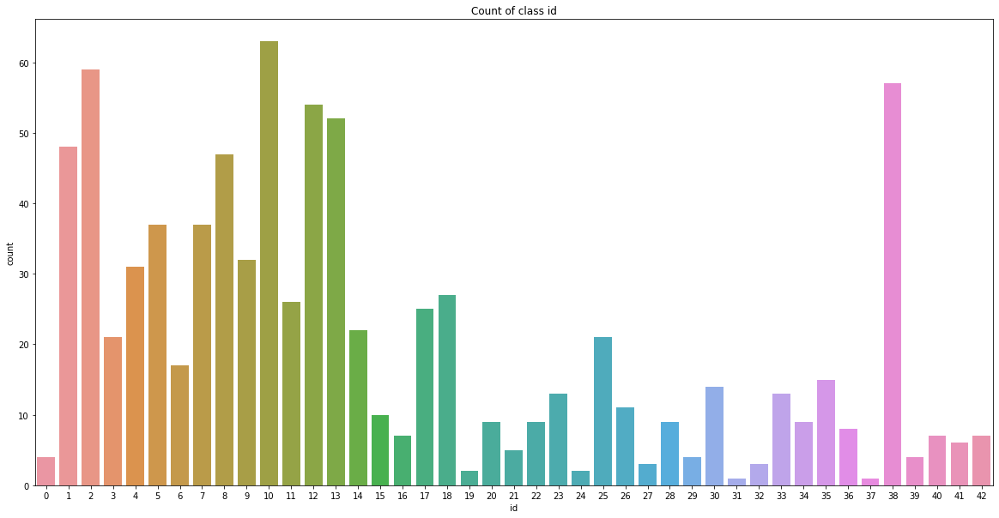

In [ ]:
%cd /content/Traffic_signs
%matplotlib inline
%run Data_analysis_det.py

In [ ]:
import pandas as pd
classes = pd.read_csv('/content/Traffic_signs/labels.csv')
print(classes)

    ClassId                                               Name
0         0                               Speed limit (20km/h)
1         1                               Speed limit (30km/h)
2         2                               Speed limit (50km/h)
3         3                               Speed limit (60km/h)
4         4                               Speed limit (70km/h)
5         5                               Speed limit (80km/h)
6         6                        End of speed limit (80km/h)
7         7                              Speed limit (100km/h)
8         8                              Speed limit (120km/h)
9         9                                         No passing
10       10       No passing for vehicles over 3.5 metric tons
11       11              Right-of-way at the next intersection
12       12                                      Priority road
13       13                                              Yield
14       14                                            

---
### Train

In [ ]:
# download already trained weights 
!gdown -O /content/Traffic_signs/Models/backup/darknet-yolov3_last.weights --id '1-4mn5BhwKenRQsAZJG-5lwy3iCrXtq3O'

Downloading...
From: https://drive.google.com/uc?id=1-4mn5BhwKenRQsAZJG-5lwy3iCrXtq3O
To: /content/Traffic_signs/Models/backup/darknet-yolov3_last.weights
246MB [00:04, 56.8MB/s]


In [ ]:
# install requirements
!pip3 install -r /content/Traffic_signs/requirements.txt

In [ ]:
%cd /content/Traffic_signs
# create file darknet.data 
def create_data():
  with open('/content/Traffic_signs/darknet.data', 'w') as f:
    f.write('classes = 1\n')
    f.write('train = /content/Traffic_signs/Dataset/GTSDB_Train/train_path.txt\n')
    f.write('valid = /content/Traffic_signs/Dataset/GTSDB_Train/val_path.txt\n')
    f.write('names = /content/Traffic_signs/classes.names\n')
    f.write('backup = /content/Traffic_signs/Models/backup')

create_data()

# create val_path.txt and train_path.txt to link images of validation set and train set
!python3 /content/Traffic_signs/create_annotations.py 

/content/Traffic_signs


In [ ]:
# check weights
import os

if os.path.isfile('/content/Traffic_signs/Models/backup/darknet-yolov3_last.weights'):
  print('WEIGHTS ALREADY PRESENT')
else:
  # check if lines 8 and 9 of /content/Traffic_signs/darknet-yolov3.cfg
  # are uncommented
  %cd /content/darknet
  # train weights
  !./darknet detector train /content/Traffic_signs/darknet.data /content/Traffic_signs/darknet-yolov3.cfg -dont_show> /content/Traffic_signs/Models/backup/train.log 

Output streaming troncato alle ultime 5000 righe.
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 94 Avg (IOU: 0.000000), count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 106 Avg (IOU: 0.819453), count: 8, class_loss = 0.001362, iou_loss = 0.148860, total_loss = 0.150222 
 total_bbox = 310973, rewritten_bbox = 0.141813 % 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 82 Avg (IOU: 0.000000), count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 94 Avg (IOU: 0.000000), count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 106 Avg (IOU: 0.743852), count: 6, class_loss = 0.510777, iou_loss = 0.378594, total_loss = 0.889372 
 total_bbox = 310979, rewritten_bbox = 0.141810 % 
v3 (ms

### Resume train (only if necessary)

To resume the training, uncomment the cell below 

In [ ]:
# !./darknet detector train /content/Traffic_signs/darknet.data /content/Traffic_signs/darknet-yolov3.cfg /content/Traffic_signs/Models/backup/darknet-yolov3_last.weights -dont_show> /content/Traffic_signs/Models/backup/train.log 


Output streaming troncato alle ultime 5000 righe.
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 106 Avg (IOU: 0.817236), count: 10, class_loss = 0.198813, iou_loss = 0.201281, total_loss = 0.400094 
 total_bbox = 187766, rewritten_bbox = 0.147524 % 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 82 Avg (IOU: 0.000000), count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 94 Avg (IOU: 0.871506), count: 6, class_loss = 0.000183, iou_loss = 0.067694, total_loss = 0.067877 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 106 Avg (IOU: 0.863835), count: 1, class_loss = 0.000367, iou_loss = 0.019930, total_loss = 0.020297 
 total_bbox = 187773, rewritten_bbox = 0.147519 % 
v3 (mse loss, Normalizer: (iou: 0.75, obj: 1.00, cls: 1.00) Region 82 Avg (IOU: 0.000000), count: 1, class_loss = 0.000000, iou_loss = 0.000000, total_loss = 0.000000 
v3 (m

---
## Recognition GTSRB - Train
---

One time with 
> model_type = "class_cnn_2"

and one time with 
> model_type = "class_cnn"


In [ ]:
%cd /content/Traffic_signs

/content/Traffic_signs


/content/Traffic_signs
Total Classes Detected: 43
Importing Classes...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
Data shapes 
 Train: (22271, 48, 48, 3) (22271,) 
 Validation: (5568, 48, 48, 3) (5568,) 
 Test: (6960, 48, 48, 3) (6960,)
Labels shape (43, 2)
Number of samples for each class [117, 1231, 1286, 777, 1130, 1092, 220, 872, 786, 834, 1188, 761, 1209, 1210, 446, 339, 233, 641, 663, 120, 195, 185, 198, 279, 154, 854, 348, 138, 287, 155, 245, 433, 135, 395, 245, 709, 208, 119, 1192, 163, 208, 145, 126]


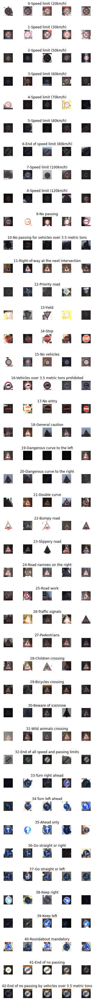

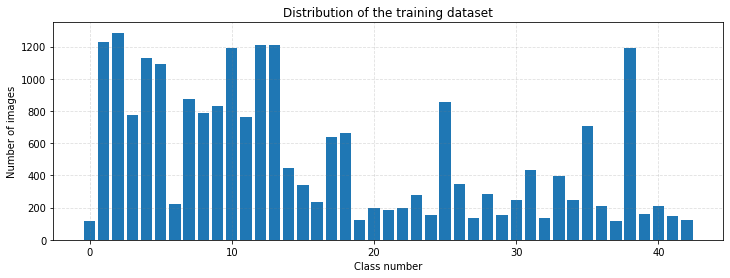

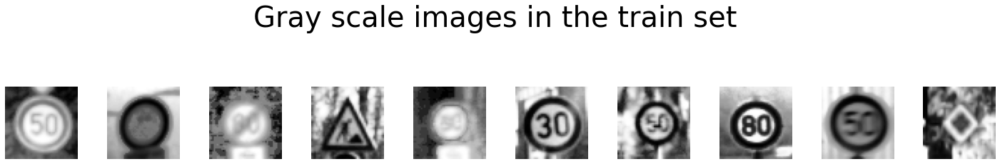

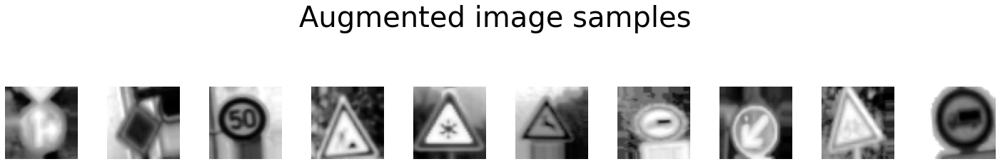

Model: "Class_CNN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
B1_Conv1 (Conv2D)            (None, 48, 48, 32)        320       
_________________________________________________________________
B1_BN1 (BatchNormalization)  (None, 48, 48, 32)        128       
_________________________________________________________________
B1_Conv2 (Conv2D)            (None, 48, 48, 32)        9248      
_________________________________________________________________
B1_BN2 (BatchNormalization)  (None, 48, 48, 32)        128       
_________________________________________________________________
B1_MP1 (MaxPooling2D)        (None, 24, 24, 32)        0         
_________________________________________________________________
B1_DB1 (DropBlock2D)         (None, 24, 24, 32)        1152      
_________________________________________________________________
B2_Conv1 (Conv2D)            (None, 24, 24, 64)        18

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:6068: UserWarning: `tf.keras.backend.random_binomial` is deprecated, and will be removed in a future version.Please use `tf.keras.backend.random_bernoulli` instead.
  warnings.warn('`tf.keras.backend.random_binomial` is deprecated, '


445/445 [==============================] - 20s 39ms/step - loss: 8.2018 - accuracy: 0.0935 - val_loss: 2.5327 - val_accuracy: 0.3218
Epoch 2/15
445/445 [==============================] - 17s 37ms/step - loss: 4.1286 - accuracy: 0.3600 - val_loss: 1.4767 - val_accuracy: 0.5977
Epoch 3/15
445/445 [==============================] - 17s 38ms/step - loss: 1.8132 - accuracy: 0.6064 - val_loss: 0.3720 - val_accuracy: 0.8845
Epoch 4/15
445/445 [==============================] - 17s 37ms/step - loss: 0.6406 - accuracy: 0.8177 - val_loss: 0.1796 - val_accuracy: 0.9423
Epoch 5/15
445/445 [==============================] - 17s 37ms/step - loss: 0.3319 - accuracy: 0.8955 - val_loss: 0.0792 - val_accuracy: 0.9752
Epoch 6/15
445/445 [==============================] - 17s 37ms/step - loss: 0.2363 - accuracy: 0.9291 - val_loss: 0.5158 - val_accuracy: 0.8657
Epoch 7/15
445/445 [==============================] - 17s 38ms/step - loss: 0.2516 - accuracy: 0.9279 - val_loss: 0.0726 - val_accuracy: 0.9777
Epo

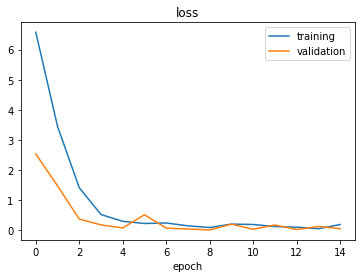

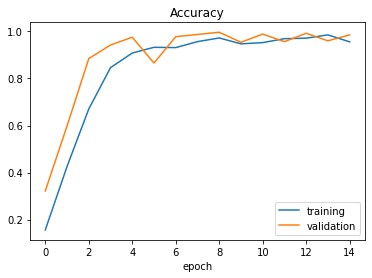

Test Score: 0.05131052806973457
Test Accuracy: 0.9872126579284668
Creation model: Models/class_cnn20210512T2140


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:6068: UserWarning: `tf.keras.backend.random_binomial` is deprecated, and will be removed in a future version.Please use `tf.keras.backend.random_bernoulli` instead.
  warnings.warn('`tf.keras.backend.random_binomial` is deprecated, '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:6068: UserWarning: `tf.keras.backend.random_binomial` is deprecated, and will be removed in a future version.Please use `tf.keras.backend.random_bernoulli` instead.
  warnings.warn('`tf.keras.backend.random_binomial` is deprecated, '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:6068: UserWarning: `tf.keras.backend.random_binomial` is deprecated, and will be removed in a future version.Please use `tf.keras.backend.random_bernoulli` instead.
  warnings.warn('`tf.keras.backend.random_binomial` is deprecated, '
/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:60

INFO:tensorflow:Assets written to: Models/class_cnn20210512T2140/assets


<Figure size 432x288 with 0 Axes>

In [ ]:
import os

# check if weights of CNN are already present 
if not os.path.isdir('/content/Traffic_signs/Models/class_cnn20210503T2012'):
  # training class_CNN
  %matplotlib inline
  %run /content/Traffic_signs/Train_rec.py

/content/Traffic_signs
Total Classes Detected: 43
Importing Classes...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
Data shapes 
 Train: (22271, 48, 48, 3) (22271,) 
 Validation: (5568, 48, 48, 3) (5568,) 
 Test: (6960, 48, 48, 3) (6960,)
Labels shape (43, 2)
Number of samples for each class [118, 1279, 1327, 810, 1142, 1025, 229, 843, 799, 841, 1128, 756, 1234, 1216, 458, 335, 228, 635, 681, 116, 182, 175, 218, 271, 160, 845, 340, 132, 324, 146, 224, 443, 134, 391, 223, 680, 208, 115, 1228, 170, 197, 128, 137]


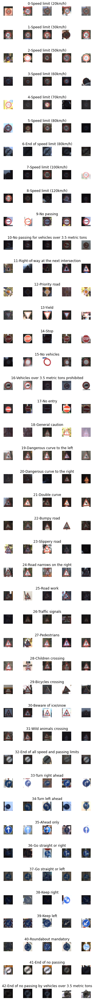

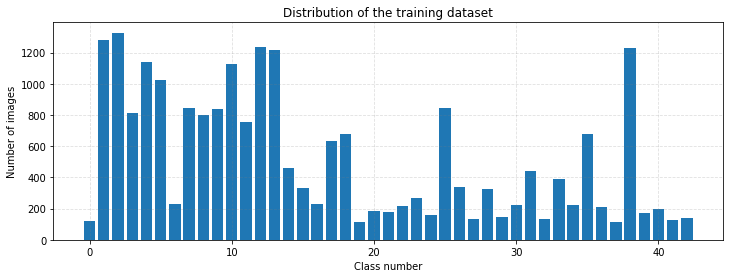

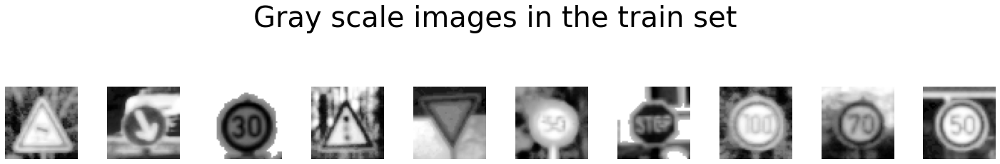

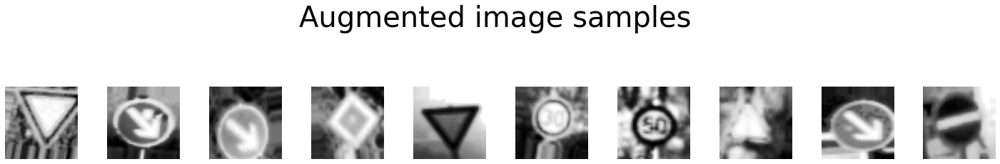

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Model: "Class_CNN_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 44, 44, 60)        1560      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 40, 40, 60)        90060     
_________________________________________________

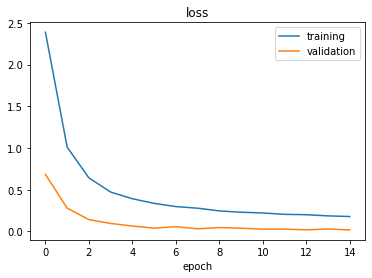

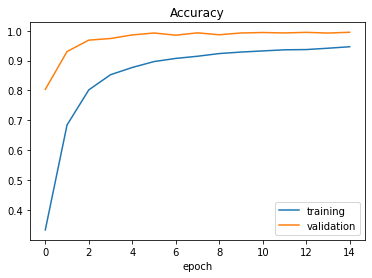

Test Score: 0.019622432067990303
Test Accuracy: 0.9939655065536499
Creation model: Models/class_cnn_220210512T2135
INFO:tensorflow:Assets written to: Models/class_cnn_220210512T2135/assets


<Figure size 432x288 with 0 Axes>

In [ ]:
import os

# check if weights of CNN2 are already present 
if not os.path.isdir('/content/Traffic_signs/Models/class_cnn_220210503T2208'):
# create class_CNN_2
%matplotlib inline
%run /content/Traffic_signs/Train_rec.py

---
## Test image

In [ ]:
# define helper function imShow
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

In [ ]:
# run custom detector with this command
%cd /content/darknet
!./darknet detector test /content/Traffic_signs/darknet.data /content/Traffic_signs/darknet-yolov3.cfg /content/Traffic_signs/Models/backup/darknet-yolov3_last.weights -thresh 0.70 /content/Traffic_signs/Dataset/GTSDB_Test/00668.jpg -dont_show 

/content/darknet
 CUDA-version: 11000 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Sh

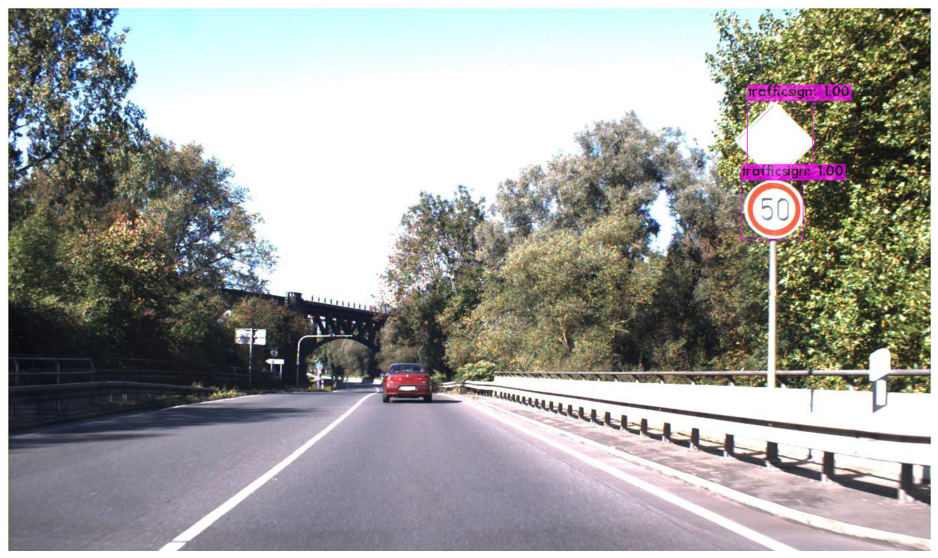

In [ ]:
imShow('predictions.jpg')

In [ ]:
# metrics for detection model 
%cd /content/darknet/
!./darknet detector map /content/Traffic_signs/darknet.data /content/Traffic_signs/darknet-yolov3.cfg /content/Traffic_signs/Models/backup/darknet-yolov3_last.weights 

/content/darknet
 CUDA-version: 11000 (11020), cuDNN: 7.6.5, GPU count: 1  
 OpenCV version: 3.2.0
 0 : compute_capability = 370, cudnn_half = 0, GPU: Tesla K80 
net.optimized_memory = 0 
mini_batch = 1, batch = 1, time_steps = 1, train = 0 
   layer   filters  size/strd(dil)      input                output
   0 Create CUDA-stream - 0 
 Create cudnn-handle 0 
conv     32       3 x 3/ 1    416 x 416 x   3 ->  416 x 416 x  32 0.299 BF
   1 conv     64       3 x 3/ 2    416 x 416 x  32 ->  208 x 208 x  64 1.595 BF
   2 conv     32       1 x 1/ 1    208 x 208 x  64 ->  208 x 208 x  32 0.177 BF
   3 conv     64       3 x 3/ 1    208 x 208 x  32 ->  208 x 208 x  64 1.595 BF
   4 Shortcut Layer: 1,  wt = 0, wn = 0, outputs: 208 x 208 x  64 0.003 BF
   5 conv    128       3 x 3/ 2    208 x 208 x  64 ->  104 x 104 x 128 1.595 BF
   6 conv     64       1 x 1/ 1    104 x 104 x 128 ->  104 x 104 x  64 0.177 BF
   7 conv    128       3 x 3/ 1    104 x 104 x  64 ->  104 x 104 x 128 1.595 BF
   8 Sh

In [ ]:
# FINAL TEST: detection and recognition 
%cd /content/Traffic_signs
!python3 /content/Traffic_signs/Test_det.py --device='gpu' --image=/content/Traffic_signs/Dataset/GTSDB_Test/00668.jpg

/content/Traffic_signs
2021-05-19 14:33:17.127298: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-05-19 14:33:19.261821: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-05-19 14:33:19.265293: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-05-19 14:33:19.287572: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-05-19 14:33:19.288384: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla K80 computeCapability: 3.7
coreClock: 0.8235GHz coreCount: 13 deviceMemorySize: 11.17GiB deviceMemoryBandwidth: 223.96GiB/s
2021-05-19 14:33:19.288440: I tensorflow/stream_executor/

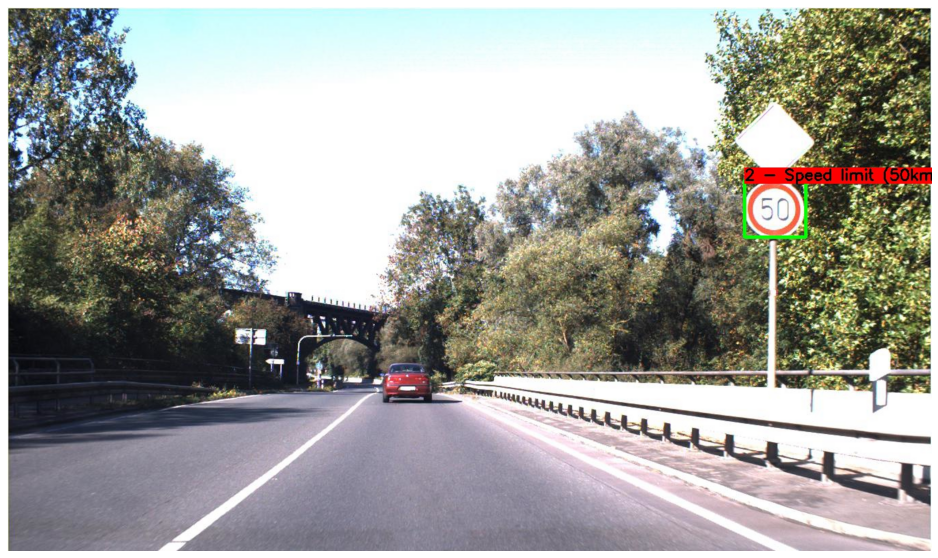

In [ ]:
imShow('/content/Traffic_signs/Output/recognition_image.jpg')

---
##Test video

In [ ]:
# download video clips in Clips folder
!gdown -O /content/Traffic_signs/Dataset/Clips/Clip1.mp4 --id '1wnZYj3IxgYKpYhGXoAaKup2fihYYdjBy'
!gdown -O /content/Traffic_signs/Dataset/Clips/Clip2.mp4 --id '1_watq8bz4BQK3bwkDLA6iUuzY8H_GshI'
!gdown -O /content/Traffic_signs/Dataset/Clips//Clip3.mp4 --id '1HNn0fzQk6-j3hXdR7cBOdKTwKK55Sac8'
!gdown -O /content/Traffic_signs/Dataset/Clips/Clip4.mp4 --id '1MyMLMIuJhGz4XwbkKoyRw6LvYbAh8AAq'
!gdown -O /content/Traffic_signs/Dataset/Clips/Clip5.mp4 --id '1QedAxbAbV_c1ibOh8NStzTFvdhN4nO4I'
!gdown -O /content/Traffic_signs/Dataset/Clips/Clip6.mp4 --id '1xhmJY7k_GUC55ks0IxVxKomL5m1hDHp6'
!gdown -O /content/Traffic_signs/Dataset/Clips/Clip7.mp4 --id '1wNTRiqzpywZ5UE5X4n9TxuhoujITEDJu'

Downloading...
From: https://drive.google.com/uc?id=1wnZYj3IxgYKpYhGXoAaKup2fihYYdjBy
To: /content/Traffic_signs/Dataset/Clips/Clip1.mp4
6.07MB [00:00, 23.0MB/s]
Downloading...
From: https://drive.google.com/uc?id=1_watq8bz4BQK3bwkDLA6iUuzY8H_GshI
To: /content/Traffic_signs/Dataset/Clips/Clip2.mp4
4.85MB [00:00, 18.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1HNn0fzQk6-j3hXdR7cBOdKTwKK55Sac8
To: /content/Traffic_signs/Dataset/Clips/Clip3.mp4
3.82MB [00:00, 17.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1MyMLMIuJhGz4XwbkKoyRw6LvYbAh8AAq
To: /content/Traffic_signs/Dataset/Clips/Clip4.mp4
11.6MB [00:00, 17.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1QedAxbAbV_c1ibOh8NStzTFvdhN4nO4I
To: /content/Traffic_signs/Dataset/Clips/Clip5.mp4
5.92MB [00:00, 22.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1xhmJY7k_GUC55ks0IxVxKomL5m1hDHp6
To: /content/Traffic_signs/Dataset/Clips/Clip6.mp4
31.7MB [00:01, 19.0MB/s]
Downloading...
From: https:/

In [ ]:
%cd /content/Traffic_signs
!python3 /content/Traffic_signs/Test_det.py --device='gpu' --video=/content/Traffic_signs/Dataset/Clips/Clip2.mp4

/content/Traffic_signs
2021-05-20 09:28:21.646808: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
2021-05-20 09:28:23.344387: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-05-20 09:28:23.345487: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-05-20 09:28:23.410097: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-05-20 09:28:23.411062: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-05-20 09:28:23.411147: I tensorflow/stream_executor/pla

In [ ]:
# Change avi video in mp4
%cd /content/Traffic_signs
!ffmpeg -i Output/recognition_video.avi Output/recognition_video.mp4

/content/Traffic_signs
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enab

In [ ]:
# Download already tested clip (only if necessary)
import os
if not os.path.isfile('/content/Traffic_signs/Output/recognition_video.mp4'):
  !gdown -O /content/Traffic_signs/Output/recognition_video.mp4 --id '16o7_HaitsD1f2-kpocdhIgnQ4QBQSaMd'

In [ ]:
# Read and decode mp4 video
from IPython.display import HTML
from base64 import b64encode
mp4 = open('Output/recognition_video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [ ]:
# Create HTML to show the video 
HTML("""
<video width="1024" height="700" controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)